In [1]:
import sys
import os

from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from keras import optimizers
from keras.optimizers import Adam, SGD
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense, Activation
from keras.layers.convolutional import Convolution2D, MaxPooling2D
from keras import callbacks
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, Callback
from keras.applications.vgg19 import VGG19
from keras.applications.resnet50 import ResNet50
from sklearn.model_selection import train_test_split
from fastai_utils import *
from custom_augmentation import *

from collections import Counter
import pandas as pd
import numpy as np
import glob
import h5py
import cv2

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from datetime import datetime
import time

start = time.time()

/usr/local/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
os.chdir('/root/Affine/Data')

In [3]:
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
#config = tf.ConfigProto(device_count = {'GPU':0})
#sess = tf.Session(config=config)
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import tensorflow as tf
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 4834990125016925139
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 8999419006136403104
physical_device_desc: "device: XLA_CPU device"
]


In [4]:
# DEV = False
# argvs = sys.argv
# argc = len(argvs)


# if argc > 1 and (argvs[1] == "--development" or argvs[1] == "-d"):
#   DEV = True
# if DEV:
#   epochs = 2
# else:
#   epochs = 100

n_epochs = 100
bs = 8
model_split_1 = 'res4a_branch2a'
model_split_2 = 'fc_start'

date = datetime.now().strftime("%m%d%Y")
counter = str(int(np.round(start)))
model_name = 'resnet50_softmax_notrain_weight_decay_6_class_Adam_dlr_clr_' + counter
print(model_name)

train_data_path = './Severe_Accidents/train/'
validation_data_path = './Severe_Accidents/val/'
test_data_path = './Severe_Accidents/test/'
data_annotation_csv_path = './Severe_Accidents/'
model_weights_no_top = '/root/Affine/models/model_weights/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
save_model_path = '/root/Affine/models/iterations/'+ date +'/' + model_name + '/'
tf_log_path = '/root/Affine/tf-log/new_data/'

if not os.path.exists('/root/Affine/models/iterations/'+ date +'/'):
    os.mkdir('/root/Affine/models/iterations/'+ date +'/')

resnet50_softmax_notrain_weight_decay_6_class_Adam_dlr_clr_1549961088


In [5]:
from keras import backend as K

classes_2 = list(range(1,13))
classes_3 = ['L','R']
classes_4 = ['F','P','B','Y','Z','D']
classes_5 = ['G','M','L','E','H','A']
classes_6 = ['W','N','S']
classes_7 = list(range(1,10))

classes = [classes_2, classes_3, classes_4, classes_5, classes_6, classes_7]
# classes = [classes_3, classes_4, classes_5, classes_6]

tot_num_classes = np.sum(len(c) for c in classes)

split_idx = [np.sum(len(classes[j]) for j in range(i)) for i in range(len(classes))][1:]
print(split_idx)

loss_wt = {}
for i in range(len(classes)):
    loss_wt['col'+str(i+2)] = np.round(len(classes[i])/tot_num_classes, 3)
print(loss_wt)

[12, 14, 20, 26, 29]
{'col2': 0.316, 'col3': 0.053, 'col4': 0.158, 'col5': 0.158, 'col6': 0.079, 'col7': 0.237}


/usr/local/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.from_iter(generator)) or the python sum builtin instead.
  del sys.path[0]
/usr/local/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.from_iter(generator)) or the python sum builtin instead.
  from ipykernel import kernelapp as app


In [6]:
data = pd.read_csv(data_annotation_csv_path + 'Data_Annotation.csv', encoding = 'latin-1')

In [7]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

def one_hot_categorical(x, classes):
    lb_enc = LabelEncoder().fit(classes)
    label_encoded = lb_enc.transform(x)
    enc = OneHotEncoder(sparse=False).fit(lb_enc.transform(classes).reshape(-1,1))
    return enc.transform(label_encoded.reshape(-1,1))

y_2 = one_hot_categorical(data['second_code'],classes_2)    
y_3 = one_hot_categorical(data['third_code'],classes_3)
# Including only side crash code 
# Not including R, C, L
y_4 = one_hot_categorical(data['fourth_code'],classes_4)
y_5 = one_hot_categorical(data['fifth_code'],classes_5)
y_6 = one_hot_categorical(data['sixth_code'],classes_6)
y_7 = one_hot_categorical(data['seventh_code'],classes_7)

# Create multi-label targets
targets = np.concatenate((y_2, y_3, y_4, y_5, y_6, y_7), axis = 1)
# targets = np.concatenate((y_3, y_4, y_5, y_6), axis = 1)
image_files = pd.DataFrame(targets)
image_files['filename'] = data['file_name'].apply(lambda x: x+'.jpg')
print('Found ' + str(image_files.shape[0]) + ' annotated images')
image_files.shape

Found 211 annotated images


/usr/local/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:368: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
/usr/local/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/_encoders.py:368: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In

(211, 39)

In [8]:
train_ids = [i.split('/')[-1].strip() for i in glob.glob(train_data_path+'*.jpg')]
train_df = image_files.loc[image_files['filename'].isin(train_ids),:].reset_index(drop = True).drop_duplicates()
print(len(train_ids), train_df.shape)

val_ids = [i.split('/')[-1].strip() for i in glob.glob(validation_data_path+'*.jpg')]
val_df = image_files.loc[image_files['filename'].isin(val_ids),:].reset_index(drop = True).drop_duplicates()
print(len(val_ids), val_df.shape)

test_ids = [i.split('/')[-1].strip() for i in glob.glob(test_data_path+'*.jpg')]
test_df = image_files.loc[image_files['filename'].isin(test_ids),:].reset_index(drop = True).drop_duplicates()
print(len(test_ids), test_df.shape)

166 (166, 39)
22 (22, 39)
21 (21, 39)


In [9]:
def split_outputs(generator, idx):
    while True:
        data = next(generator)
        x = data[0]
        y = np.split(data[1], idx, axis=1)
        yield x, y
        
def read_data(img_data_gen, base_dir, in_df, idx, path_col = 'filename',
                        y_col = 'targets', batch_size = 8, n_classes = 38):
    
    print(in_df.shape)
    df_gen = img_data_gen.flow_from_dataframe(in_df, base_dir,
                                              x_col = 'filename', y_col= list(range(n_classes)),
                                              has_ext = True, target_size = (512, 512),
                                              color_mode = 'rgb', class_mode = 'other',
                                              batch_size = batch_size)
    
    return split_outputs(df_gen, idx)

In [10]:
# img_train_gen = ImageDataGenerator(rescale=1/255,
#                                    rotation_range=10,
#                                    width_shift_range=0.1,
#                                    height_shift_range=0.1,
#                                    shear_range=0.15,
#                                   brightness_range = (0.01, 1.38))
img_train_gen = ImageDataGenerator(rescale=1/255, preprocessing_function=choose_fun)
img_val_gen = ImageDataGenerator(rescale=1/255)
img_test_gen = ImageDataGenerator(rescale=1/255)

train_gen = read_data(img_train_gen, train_data_path,train_df, idx = split_idx,
                                batch_size = bs, n_classes = tot_num_classes)
val_gen = read_data(img_val_gen,validation_data_path, val_df,idx = split_idx,
                              batch_size = bs,  n_classes = tot_num_classes)
test_gen = read_data(img_test_gen, test_data_path,test_df,idx = split_idx,
                               batch_size = bs,  n_classes = tot_num_classes)

(166, 39)
Found 166 images.
(22, 39)
Found 22 images.
(21, 39)
Found 21 images.


(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)


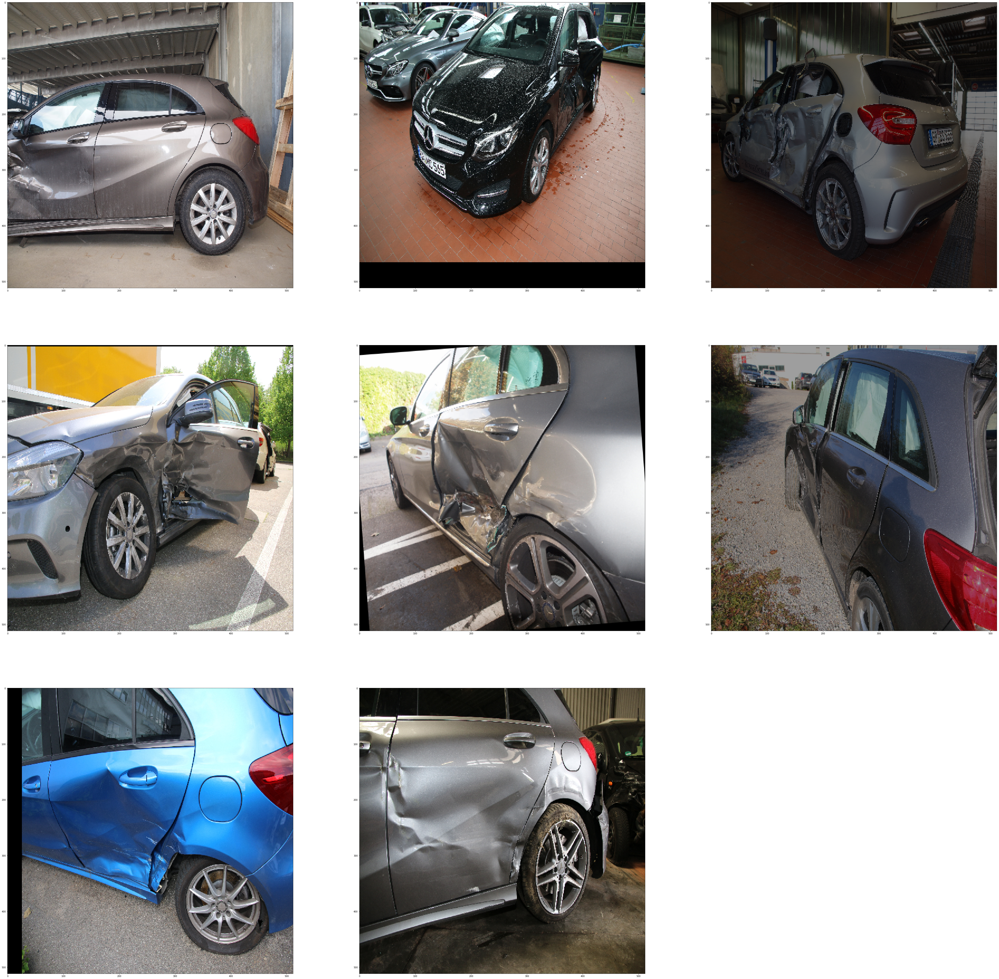

In [11]:
for x, y in train_gen:
    break

w=100
h=100
fig=plt.figure(figsize=(80, 80))
columns = 3
rows = 3
for i in range(0, len(x)):
    fig.add_subplot(rows, columns, i+1)
    if i!=8:
        plt.imshow(x[i])
        print(x[i].shape)
plt.show()

In [12]:
#from resnet50 import ResNet50
base_model = ResNet50(include_top=False, weights=None)
base_model.load_weights(model_weights_no_top)

/usr/local/anaconda3/lib/python3.6/site-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


In [13]:
# Freezing base model
trainable = False
for i,layer in enumerate(base_model.layers[:]):
    try:
        if layer.name == model_split_1:
            trainable = True
    except:
        pass
    layer.trainable = trainable
    print(layer, layer.trainable)

<keras.engine.input_layer.InputLayer object at 0x7f1b2e24f7f0> False
<keras.layers.convolutional.ZeroPadding2D object at 0x7f1b26606e48> False
<keras.layers.convolutional.Conv2D object at 0x7f1b266e0f98> False
<keras.layers.normalization.BatchNormalization object at 0x7f1b26674710> False
<keras.layers.core.Activation object at 0x7f1b2c185080> False
<keras.layers.convolutional.ZeroPadding2D object at 0x7f1b265d9f60> False
<keras.layers.pooling.MaxPooling2D object at 0x7f1b2661d4e0> False
<keras.layers.convolutional.Conv2D object at 0x7f1b26690e80> False
<keras.layers.normalization.BatchNormalization object at 0x7f1b264fa518> False
<keras.layers.core.Activation object at 0x7f1b264fae80> False
<keras.layers.convolutional.Conv2D object at 0x7f1b2649ecf8> False
<keras.layers.normalization.BatchNormalization object at 0x7f1b264b9eb8> False
<keras.layers.core.Activation object at 0x7f1b2647a3c8> False
<keras.layers.convolutional.Conv2D object at 0x7f1b263ad668> False
<keras.layers.convolution

In [14]:
from keras.layers import GlobalAveragePooling2D, Dense, BatchNormalization
from keras import regularizers

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001), name = 'fc_start')(x)
x = Dropout(0.5)(x)

# Col 2
x2 = Dense(128, activation='relu')(x)
x2 = BatchNormalization()(x2)
x2 = Dropout(0.5)(x2)
out2 = Dense(len(classes_2), activation='softmax', name = 'col2')(x2)

# Col 3
x3 = Dense(128, activation='relu')(x)
x3 = BatchNormalization()(x3)
x3 = Dropout(0.5)(x3)
out3 = Dense(len(classes_3), activation='softmax', name = 'col3')(x3)

# Col 4
x4 = Dense(128, activation='relu')(x)
x4 = BatchNormalization()(x4)
x4 = Dropout(0.5)(x4)
out4 = Dense(len(classes_4), activation='softmax', name = 'col4')(x4)

# Col 5
x5 = Dense(128, activation='relu')(x)
x5 = BatchNormalization()(x5)
x5 = Dropout(0.5)(x5)
out5 = Dense(len(classes_5), activation='softmax', name = 'col5')(x5)

# Col 6
x6 = Dense(128, activation='relu')(x)
x6 = BatchNormalization()(x6)
x6 = Dropout(0.5)(x6)
out6 = Dense(len(classes_6), activation='softmax', name = 'col6')(x6)

# Col 7
x7 = Dense(128, activation='relu')(x)
x7 = BatchNormalization()(x7)
x7 = Dropout(0.5)(x7)
out7 = Dense(len(classes_7), activation='softmax', name = 'col7')(x7)

In [15]:
from keras.models import Model

model = Model(inputs=base_model.input, outputs=[out2, out3, out4, out5, out6, out7])

In [16]:
for layer in model.layers:
    print(layer, layer.trainable)

<keras.engine.input_layer.InputLayer object at 0x7f1b2e24f7f0> False
<keras.layers.convolutional.ZeroPadding2D object at 0x7f1b26606e48> False
<keras.layers.convolutional.Conv2D object at 0x7f1b266e0f98> False
<keras.layers.normalization.BatchNormalization object at 0x7f1b26674710> False
<keras.layers.core.Activation object at 0x7f1b2c185080> False
<keras.layers.convolutional.ZeroPadding2D object at 0x7f1b265d9f60> False
<keras.layers.pooling.MaxPooling2D object at 0x7f1b2661d4e0> False
<keras.layers.convolutional.Conv2D object at 0x7f1b26690e80> False
<keras.layers.normalization.BatchNormalization object at 0x7f1b264fa518> False
<keras.layers.core.Activation object at 0x7f1b264fae80> False
<keras.layers.convolutional.Conv2D object at 0x7f1b2649ecf8> False
<keras.layers.normalization.BatchNormalization object at 0x7f1b264b9eb8> False
<keras.layers.core.Activation object at 0x7f1b2647a3c8> False
<keras.layers.convolutional.Conv2D object at 0x7f1b263ad668> False
<keras.layers.convolution

In [17]:
from keras import backend as K
import tensorflow as tf

def f1(y_true, y_pred):

    y_true = tf.cast(y_true, tf.float64)
    y_pred = tf.cast(y_pred, tf.float64)

    TP = tf.count_nonzero(y_pred * y_true, axis=0, dtype = tf.float64)
    FP = tf.count_nonzero(y_pred * (y_true - 1), axis=0, dtype = tf.float64)
    FN = tf.count_nonzero((y_pred - 1) * y_true, axis=0, dtype = tf.float64)

    add_dummy = lambda x: x + K.epsilon()
    precision = TP /  tf.map_fn(add_dummy, (TP + FP))
    recall = TP / tf.map_fn(add_dummy, (TP + FN))
    f1 = 2 * precision * recall / tf.map_fn(add_dummy, (precision + recall))

    weights = tf.reduce_sum(y_true, axis=0)
    weights /= tf.reduce_sum(weights)
    return tf.reduce_sum(f1 * weights)


Epoch 1/1
21/21 [==============================] - 95s 5s/step - loss: 15.4340 - col2_loss: 3.5354 - col3_loss: 0.9836 - col4_loss: 2.7610 - col5_loss: 2.9192 - col6_loss: 1.8142 - col7_loss: 2.9489 - col2_f1: 0.3300 - col2_acc: 0.0655 - col3_f1: 0.5268 - col3_acc: 0.5853 - col4_f1: 0.3861 - col4_acc: 0.2223 - col5_f1: 0.5305 - col5_acc: 0.1784 - col6_f1: 0.5689 - col6_acc: 0.3790 - col7_f1: 0.4939 - col7_acc: 0.2163


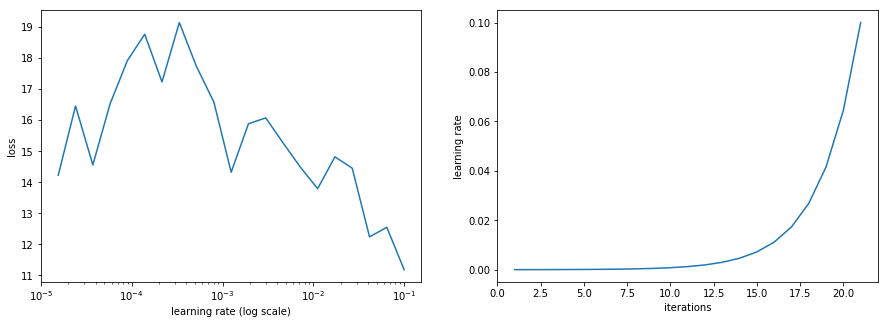

In [18]:
# Find LR

def lr_finder(mod, train_generator, training_steps, optimizer, loss_type, metrics, lr_range = [1e-5, 0.1]):
    
    lr_find = LR_Find(iterations = training_steps,
                      jump = 6,
                      min_lr = lr_range[0],
                      max_lr = lr_range[1])
    mod.compile(loss = loss_type,
                optimizer=optimizer,
                metrics=metrics)
    mod.fit_generator(train_generator,
                        steps_per_epoch = training_steps,
                        epochs = 1,
                        workers = 1,
                        callbacks = [lr_find])

    fig=plt.figure(figsize=(15, 5))
    fig.add_subplot(1, 2, 1)

    # Show LR vs Loss
    lr_find.plot()
    fig.add_subplot(1, 2, 2)
    
    # Show LR vs Iterations
    lr_find.plot_lr()
    plt.show()
    
lr_finder(mod = model,
          train_generator = train_gen,
          training_steps = np.ceil(len(train_ids)/bs),
          optimizer = Adam(),
          loss_type = 'categorical_crossentropy',
          metrics = [f1,"accuracy"])

In [19]:
if not os.path.exists(save_model_path):
    os.mkdir(save_model_path)

model_checkpoint = ModelCheckpoint(save_model_path + date + '_checkpoint_' + model_name +'.h5',
                                   monitor='val_loss', 
                                   mode = 'auto', save_best_only=True, verbose=2)

# tb_cb = callbacks.TensorBoard(log_dir=tf_log_path, histogram_freq=0)

early_stopping = EarlyStopping(monitor='val_loss', mode = 'auto',patience = 20, verbose=2)

# reduce_lr = ReduceLROnPlateau(monitor='val_loss', mode = 'auto',factor = 0.8, patience = 5, min_lr = 1e-4, verbose=2)

# For cyclical Learning Rate
sched = LR_Cycle(iterations = np.ceil(len(train_ids)/bs),
                 cycle_mult = 2)

cbks = [model_checkpoint,early_stopping,sched]

In [20]:
# opt = Adam(lr = 1e-3)

# For Differential Learning Rate
split_layer = [layer for layer in model.layers if layer.name == model_split_2][0]
opt = Adam_dlr(split_l = split_layer,
               lr = [1e-4, 1e-2])

model.compile(loss = 'categorical_crossentropy',
              optimizer = opt,
              metrics = [f1,"accuracy"])

# model.compile(loss = 'categorical_crossentropy',
#               optimizer = opt,
#               metrics = [f1,"accuracy"],
#               loss_weights = loss_wt)

In [21]:
history = model.fit_generator(train_gen,
                              steps_per_epoch = np.ceil(len(train_ids)/bs),
                              epochs = n_epochs,
                              validation_data = val_gen,
                              workers = 1,
                              validation_steps = np.ceil(len(val_ids)/bs),
                              callbacks = cbks)

Epoch 1/100
21/21 [==============================] - 100s 5s/step - loss: 14.8532 - col2_loss: 3.5017 - col3_loss: 1.3021 - col4_loss: 2.4500 - col5_loss: 2.3422 - col6_loss: 1.5070 - col7_loss: 2.8637 - col2_f1: 0.3547 - col2_acc: 0.1489 - col3_f1: 0.5399 - col3_acc: 0.4662 - col4_f1: 0.3933 - col4_acc: 0.2759 - col5_f1: 0.5314 - col5_acc: 0.2561 - col6_f1: 0.5848 - col6_acc: 0.4524 - col7_f1: 0.4909 - col7_acc: 0.1846 - val_loss: 10.2688 - val_col2_loss: 3.1621 - val_col3_loss: 0.7779 - val_col4_loss: 2.1851 - val_col5_loss: 0.9002 - val_col6_loss: 0.6181 - val_col7_loss: 1.5160 - val_col2_f1: 0.3220 - val_col2_acc: 0.0455 - val_col3_f1: 0.5326 - val_col3_acc: 0.6818 - val_col4_f1: 0.4098 - val_col4_acc: 0.4545 - val_col5_f1: 0.5160 - val_col5_acc: 0.6364 - val_col6_f1: 0.5781 - val_col6_acc: 0.8182 - val_col7_f1: 0.5430 - val_col7_acc: 0.2727

Epoch 00001: val_loss improved from inf to 10.26882, saving model to /root/Affine/models/iterations/02122019/resnet50_softmax_notrain_weight_

Epoch 9/100
21/21 [==============================] - 108s 5s/step - loss: 7.2552 - col2_loss: 1.9228 - col3_loss: 0.6548 - col4_loss: 1.2728 - col5_loss: 0.7118 - col6_loss: 0.5979 - col7_loss: 0.9763 - col2_f1: 0.3378 - col2_acc: 0.3295 - col3_f1: 0.5304 - col3_acc: 0.7003 - col4_f1: 0.4141 - col4_acc: 0.4802 - col5_f1: 0.5345 - col5_acc: 0.6765 - col6_f1: 0.5715 - col6_acc: 0.8175 - col7_f1: 0.4898 - col7_acc: 0.5577 - val_loss: 9.8046 - val_col2_loss: 2.7979 - val_col3_loss: 0.8553 - val_col4_loss: 2.3855 - val_col5_loss: 1.0135 - val_col6_loss: 0.6103 - val_col7_loss: 0.9908 - val_col2_f1: 0.3670 - val_col2_acc: 0.1364 - val_col3_f1: 0.5483 - val_col3_acc: 0.6818 - val_col4_f1: 0.4268 - val_col4_acc: 0.1364 - val_col5_f1: 0.5150 - val_col5_acc: 0.6364 - val_col6_f1: 0.5781 - val_col6_acc: 0.8182 - val_col7_f1: 0.4896 - val_col7_acc: 0.6364

Epoch 00009: val_loss did not improve from 9.18951
Epoch 10/100
21/21 [==============================] - 109s 5s/step - loss: 7.2192 - col2_los

21/21 [==============================] - 90s 4s/step - loss: 6.8416 - col2_loss: 1.6950 - col3_loss: 0.6331 - col4_loss: 1.3179 - col5_loss: 0.6886 - col6_loss: 0.5242 - col7_loss: 1.0215 - col2_f1: 0.3569 - col2_acc: 0.3433 - col3_f1: 0.5378 - col3_acc: 0.6787 - col4_f1: 0.4044 - col4_acc: 0.4247 - col5_f1: 0.5380 - col5_acc: 0.6627 - col6_f1: 0.5853 - col6_acc: 0.8194 - col7_f1: 0.5066 - col7_acc: 0.5436 - val_loss: 8.9869 - val_col2_loss: 2.6183 - val_col3_loss: 0.7330 - val_col4_loss: 2.2863 - val_col5_loss: 0.7845 - val_col6_loss: 0.7405 - val_col7_loss: 0.8976 - val_col2_f1: 0.2948 - val_col2_acc: 0.1818 - val_col3_f1: 0.5189 - val_col3_acc: 0.6818 - val_col4_f1: 0.3898 - val_col4_acc: 0.1364 - val_col5_f1: 0.5199 - val_col5_acc: 0.6364 - val_col6_f1: 0.5589 - val_col6_acc: 0.8182 - val_col7_f1: 0.4945 - val_col7_acc: 0.6364

Epoch 00018: val_loss improved from 9.18951 to 8.98693, saving model to /root/Affine/models/iterations/02122019/resnet50_softmax_notrain_weight_decay_6_clas

21/21 [==============================] - 109s 5s/step - loss: 5.6890 - col2_loss: 1.4024 - col3_loss: 0.3474 - col4_loss: 1.3169 - col5_loss: 0.6296 - col6_loss: 0.4809 - col7_loss: 0.9103 - col2_f1: 0.3451 - col2_acc: 0.4505 - col3_f1: 0.5391 - col3_acc: 0.8692 - col4_f1: 0.4041 - col4_acc: 0.4307 - col5_f1: 0.5361 - col5_acc: 0.7342 - col6_f1: 0.5678 - col6_acc: 0.8533 - col7_f1: 0.4831 - col7_acc: 0.5855 - val_loss: 17.6846 - val_col2_loss: 6.0571 - val_col3_loss: 4.2322 - val_col4_loss: 2.9902 - val_col5_loss: 0.9727 - val_col6_loss: 0.8910 - val_col7_loss: 1.9334 - val_col2_f1: 0.3479 - val_col2_acc: 0.0455 - val_col3_f1: 0.5674 - val_col3_acc: 0.3182 - val_col4_f1: 0.4210 - val_col4_acc: 0.2727 - val_col5_f1: 0.5298 - val_col5_acc: 0.3636 - val_col6_f1: 0.5781 - val_col6_acc: 0.1818 - val_col7_f1: 0.4946 - val_col7_acc: 0.2727

Epoch 00035: val_loss did not improve from 8.01272
Epoch 36/100
21/21 [==============================] - 109s 5s/step - loss: 5.6026 - col2_loss: 1.3746 -


Epoch 00043: val_loss did not improve from 7.39697
Epoch 44/100
21/21 [==============================] - 108s 5s/step - loss: 4.9273 - col2_loss: 1.2165 - col3_loss: 0.1734 - col4_loss: 1.2209 - col5_loss: 0.4042 - col6_loss: 0.4133 - col7_loss: 0.8037 - col2_f1: 0.3467 - col2_acc: 0.5298 - col3_f1: 0.5269 - col3_acc: 0.9326 - col4_f1: 0.4023 - col4_acc: 0.4922 - col5_f1: 0.5360 - col5_acc: 0.8156 - col6_f1: 0.5419 - col6_acc: 0.8611 - col7_f1: 0.4922 - col7_acc: 0.6370 - val_loss: 10.5230 - val_col2_loss: 3.1374 - val_col3_loss: 1.4023 - val_col4_loss: 2.5102 - val_col5_loss: 0.9785 - val_col6_loss: 0.9206 - val_col7_loss: 0.9056 - val_col2_f1: 0.3015 - val_col2_acc: 0.1818 - val_col3_f1: 0.5189 - val_col3_acc: 0.6818 - val_col4_f1: 0.4366 - val_col4_acc: 0.1364 - val_col5_f1: 0.5199 - val_col5_acc: 0.6364 - val_col6_f1: 0.5589 - val_col6_acc: 0.8182 - val_col7_f1: 0.4994 - val_col7_acc: 0.6364

Epoch 00044: val_loss did not improve from 7.39697
Epoch 45/100
21/21 [==================

21/21 [==============================] - 98s 5s/step - loss: 4.2279 - col2_loss: 0.9803 - col3_loss: 0.1148 - col4_loss: 1.0392 - col5_loss: 0.3429 - col6_loss: 0.3470 - col7_loss: 0.7292 - col2_f1: 0.3280 - col2_acc: 0.6687 - col3_f1: 0.5262 - col3_acc: 0.9583 - col4_f1: 0.4068 - col4_acc: 0.6072 - col5_f1: 0.5229 - col5_acc: 0.8671 - col6_f1: 0.5684 - col6_acc: 0.8671 - col7_f1: 0.4830 - col7_acc: 0.6546 - val_loss: 11.0639 - val_col2_loss: 3.2515 - val_col3_loss: 1.6042 - val_col4_loss: 2.5333 - val_col5_loss: 1.0070 - val_col6_loss: 1.0577 - val_col7_loss: 0.9409 - val_col2_f1: 0.3208 - val_col2_acc: 0.1818 - val_col3_f1: 0.5189 - val_col3_acc: 0.6818 - val_col4_f1: 0.3904 - val_col4_acc: 0.1364 - val_col5_f1: 0.5150 - val_col5_acc: 0.6364 - val_col6_f1: 0.5589 - val_col6_acc: 0.8182 - val_col7_f1: 0.4790 - val_col7_acc: 0.6364

Epoch 00053: val_loss did not improve from 7.39697
Epoch 54/100
21/21 [==============================] - 89s 4s/step - loss: 4.2960 - col2_loss: 1.0558 - c

In [22]:
history.history.keys()

dict_keys(['val_loss', 'val_col2_loss', 'val_col3_loss', 'val_col4_loss', 'val_col5_loss', 'val_col6_loss', 'val_col7_loss', 'val_col2_f1', 'val_col2_acc', 'val_col3_f1', 'val_col3_acc', 'val_col4_f1', 'val_col4_acc', 'val_col5_f1', 'val_col5_acc', 'val_col6_f1', 'val_col6_acc', 'val_col7_f1', 'val_col7_acc', 'loss', 'col2_loss', 'col3_loss', 'col4_loss', 'col5_loss', 'col6_loss', 'col7_loss', 'col2_f1', 'col2_acc', 'col3_f1', 'col3_acc', 'col4_f1', 'col4_acc', 'col5_f1', 'col5_acc', 'col6_f1', 'col6_acc', 'col7_f1', 'col7_acc'])

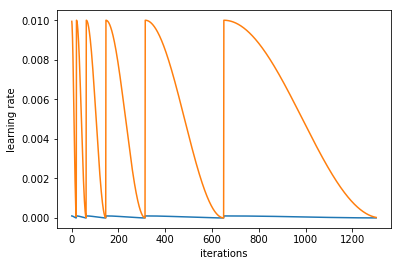

In [23]:
sched.plot_lr()

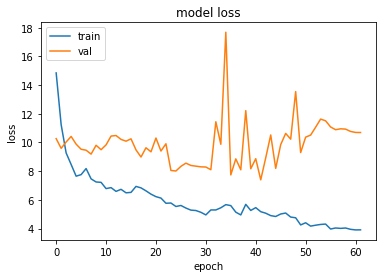

In [24]:
# summarize history for accuracy
# plt.plot(history.history['acc'])
# plt.plot(history.history['val_acc'])
# plt.title('model accuracy')
# plt.ylabel('accuracy')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [25]:
from keras.models import model_from_json

model_json = model.to_json()
with open(save_model_path + date + '_' + model_name + '_model.json', "w", encoding = 'utf-8') as json_file:
    json_file.write(model_json)
# model.save(save_model_path + date + '_' + model_name + '_model.h5')
model.save_weights(save_model_path + date + '_' + model_name + '_weights.h5')

#Calculate execution time

end = time.time()
dur = end-start

if dur<60:
    print("Execution Time:",dur,"seconds")
elif dur>60 and dur<3600:
    dur=dur/60
    print("Execution Time:",dur,"minutes")
else:
    dur=dur/(60*60)
    print("Execution Time:",dur,"hours")

Execution Time: 1.7263773287004895 hours


In [26]:
# def model_evaluation(model, generator, folder, n_steps, n_classes):
#     eval_metrics = model.evaluate_generator(generator, workers = 1, steps = n_steps)
#     print(folder + ' :')
#     print('Loss: ' + str(eval_metrics[0]))
#     print('Columnwise f1: ',str([eval_metrics[i] for i in range(1 + n_classes, 1 + 3*n_classes, 2)]))
#     print()
    
# model_evaluation(model, train_gen, 'Train', n_steps = (len(train_ids)// bs + 1), n_classes = len(classes))
# model_evaluation(model, val_gen, 'Validation', n_steps = (len(val_ids)// bs + 1), n_classes = len(classes))
# model_evaluation(model, test_gen, 'Test', n_steps = (len(test_ids)// bs + 1), n_classes = len(classes))

In [27]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, None, None, 6 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation

In [28]:
from keras.models import load_model

json_file = open(save_model_path + date + '_' + model_name + '_model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json, 
                        custom_objects={'f1':f1, 'Adam_dlr':Adam_dlr})
model.load_weights(save_model_path + date + '_checkpoint_' + model_name +'.h5')

# opt = Adam_dlr(split_l = split_layer, lr = [1e-5, 1e-3])
model.compile(loss='categorical_crossentropy',
              optimizer=opt,
              metrics=[f1,"accuracy"])

In [29]:
def model_evaluation(model, generator, folder, n_steps, n_classes):
    eval_metrics = model.evaluate_generator(generator, workers = 1, steps = n_steps)
    print(folder + ' :')
    print('Loss: ' + str(eval_metrics[0]))
    print('Columnwise f1: ',str([eval_metrics[i] for i in range(1 + n_classes, 1 + 3*n_classes, 2)]))
    print()
    
model_evaluation(model, train_gen, 'Train', n_steps = (len(train_ids)// bs + 1), n_classes = len(classes))
model_evaluation(model, val_gen, 'Validation', n_steps = (len(val_ids)// bs + 1), n_classes = len(classes))
model_evaluation(model, test_gen, 'Test', n_steps = (len(test_ids)// bs + 1), n_classes = len(classes))

Train :
Loss: 7.378642943968256
Columnwise f1:  [0.3486851695636987, 0.5380662808738564, 0.39368899127223694, 0.5266154990798584, 0.5747752405128568, 0.47571710100712516]

Validation :
Loss: 7.287354425950483
Columnwise f1:  [0.29328999748067947, 0.5242423697878834, 0.4316738304534681, 0.5160172608095286, 0.6074035304649342, 0.48773443299134694]

Test :
Loss: 7.678407759893508
Columnwise f1:  [0.34134537788691466, 0.5265992720740494, 0.37399843638254165, 0.5147973162601185, 0.5556411318001722, 0.48589289004601627]



In [30]:
# Need to add rules for predictions

def get_predictions(model, base_dir, generator, in_df, idx, num_classes, n_steps, threshold = 0.5):
    
    y_true = np.split(np.array(in_df.loc[:,list(range(num_classes))]), idx, axis=1)
    print(np.array(in_df.loc[:,list(range(num_classes))]).shape)
    true = [np.argmax(x, axis = 1) for x in y_true]
    
    y_pred = model.predict_generator(generator, workers = 1, steps = n_steps)
    pred = [np.argmax(x, axis = 1) for x in y_pred]
    
    return (true, pred)

train_true, train_pred = get_predictions(model, train_data_path, train_gen, train_df, idx = split_idx,
                                         num_classes = tot_num_classes, n_steps = (len(train_ids)// bs + 1))
val_true, val_pred = get_predictions(model, validation_data_path, val_gen, val_df, idx = split_idx,
                                     num_classes = tot_num_classes, n_steps = (len(val_ids)// bs + 1))
test_true, test_pred = get_predictions(model, test_data_path, test_gen, test_df, idx = split_idx,
                                       num_classes = tot_num_classes, n_steps = (len(test_ids)// bs + 1))

(166, 38)
(22, 38)
(21, 38)


In [31]:
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=False):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(5, 5))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

In [32]:
import sklearn.metrics as metrics

def plot_cm(true, pred, classes, i):
    
    le = LabelEncoder().fit(classes)
    report = metrics.confusion_matrix(le.inverse_transform(true), le.inverse_transform(pred),labels = classes)
    plot_confusion_matrix(report,classes, title = 'col_' + str(i))
    
def plot_cm_all_codes(true, pred, list_classes):
    
    for i in range(len(classes)):
        plot_cm(true[i], pred[i], list_classes[i], i+2)

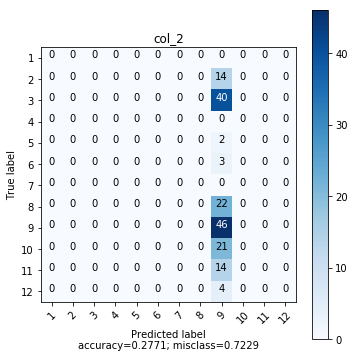

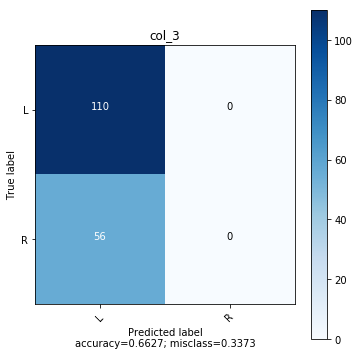

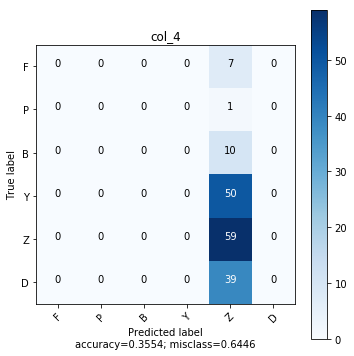

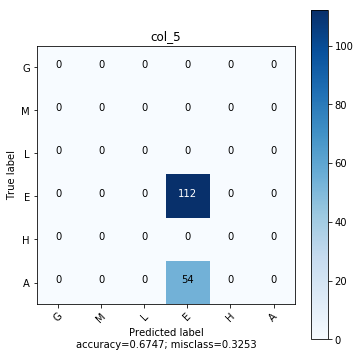

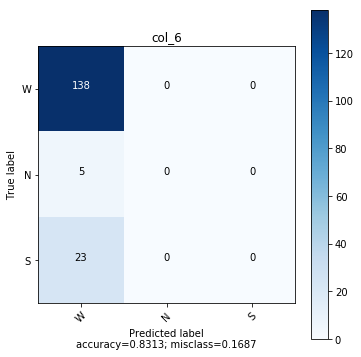

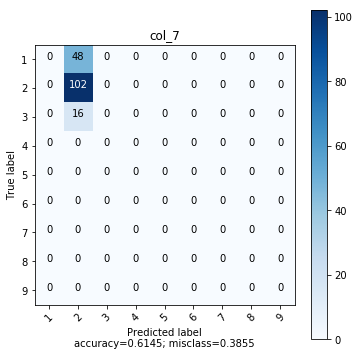

In [33]:
plot_cm_all_codes(train_true, train_pred, classes)

In [34]:
def cm_model_report(writer, folder, true, pred, classes):
    
    print('************' + folder + '*************')
    total_samples = len(true[0])
    start = 0
    m = []
    for i in range(len(classes)):
        
        # Accuracy Metrics
        prf = np.round(metrics.precision_recall_fscore_support(true[i], pred[i], average='weighted')[:-1],4)
        acc = np.round(metrics.accuracy_score(true[i], pred[i]),4)
        metric_list = ['Col'+str(i+2)]
        metric_list.extend(prf)
        metric_list.extend([acc])
        m.append(metric_list)
        print('col_' + str(i+2) + ': ' + str(metric_list))
        
        #Confusion Matrix
        le = LabelEncoder().fit(classes[i])
        report = metrics.confusion_matrix(le.inverse_transform(true[i]), le.inverse_transform(pred[i]),labels = classes[i])
        df = pd.DataFrame(report, columns = classes[i], index = classes[i])
        df.to_excel(writer,sheet_name='CM_' + folder ,startrow=start , startcol=0)   
        start = start + len(classes[i]) + 2
    
    overall_acc = (pd.DataFrame(true) == pd.DataFrame(pred)).all().sum() / total_samples
    print(folder + ' overall accuracy: ', str(np.round(overall_acc *100, 2)))
    metrics_df = pd.DataFrame(m, columns = ['Col','Precision','Recall','F1','Accuracy'])
    metrics_df.to_excel(writer, sheet_name=folder, index = False)
    pd.DataFrame({'Accuracy' : [overall_acc],'Samples':[total_samples]}).to_excel(writer, sheet_name=folder, startrow = 8, index = False)
    print()
    
    return writer


In [35]:
writer = pd.ExcelWriter(save_model_path + date + '_' + model_name + '_report.xlsx', engine='xlsxwriter')
writer = cm_model_report(writer, 'train', train_true, train_pred, classes)    
writer = cm_model_report(writer, 'val', val_true, val_pred, classes) 
writer = cm_model_report(writer, 'test', test_true, test_pred, classes) 
writer.save()

************train*************
col_2: ['Col2', 0.0768, 0.2771, 0.1203, 0.2771]
col_3: ['Col3', 0.4391, 0.6627, 0.5282, 0.6627]
col_4: ['Col4', 0.1263, 0.3554, 0.1864, 0.3554]
col_5: ['Col5', 0.4552, 0.6747, 0.5436, 0.6747]
col_6: ['Col6', 0.6911, 0.8313, 0.7548, 0.8313]
col_7: ['Col7', 0.3776, 0.6145, 0.4677, 0.6145]
train overall accuracy:  5.42

************val*************
col_2: ['Col2', 0.0331, 0.1818, 0.0559, 0.1818]
col_3: ['Col3', 0.4649, 0.6818, 0.5528, 0.6818]
col_4: ['Col4', 0.2066, 0.4545, 0.2841, 0.4545]
col_5: ['Col5', 0.405, 0.6364, 0.4949, 0.6364]
col_6: ['Col6', 0.6694, 0.8182, 0.7364, 0.8182]
col_7: ['Col7', 0.405, 0.6364, 0.4949, 0.6364]
val overall accuracy:  4.55

************test*************
col_2: ['Col2', 0.0023, 0.0476, 0.0043, 0.0476]
col_3: ['Col3', 0.4444, 0.6667, 0.5333, 0.6667]
col_4: ['Col4', 0.1111, 0.3333, 0.1667, 0.3333]
col_5: ['Col5', 0.3832, 0.619, 0.4734, 0.619]
col_6: ['Col6', 0.6553, 0.8095, 0.7243, 0.8095]
col_7: ['Col7', 0.3832, 0.619, 0.4734,

/usr/local/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predict

In [36]:
label_enc_dict = {}
for i, c in enumerate(classes):
    label_enc_dict[i] = LabelEncoder().fit(c)
    
test_images = test_data_path + test_df['filename']

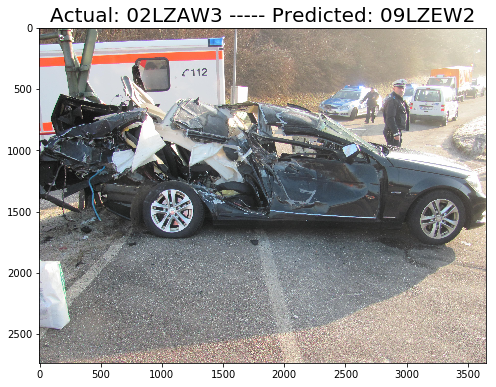

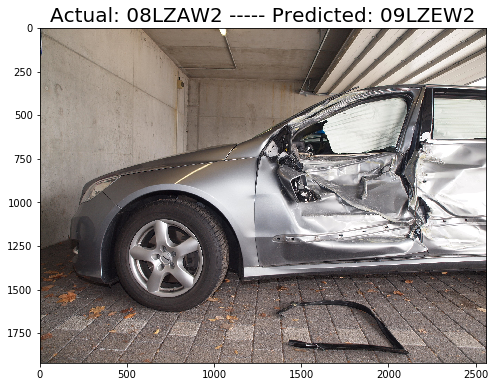

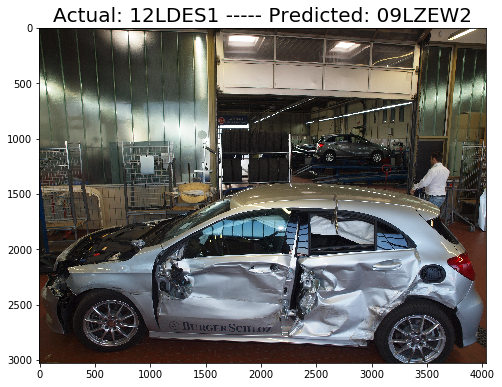

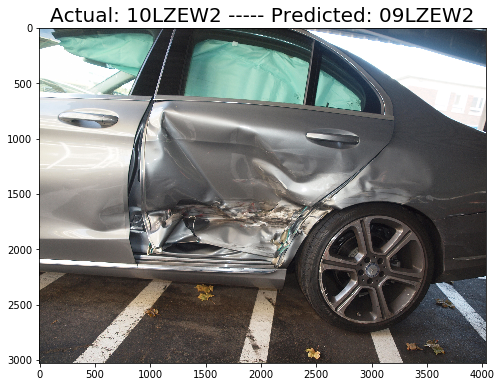

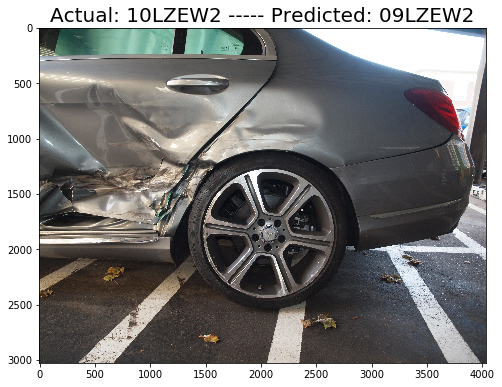

...

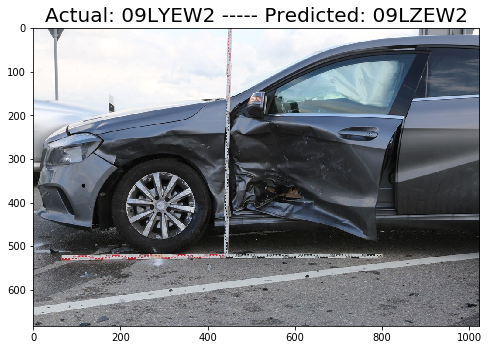

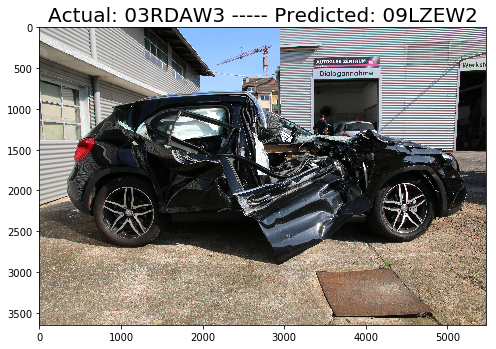

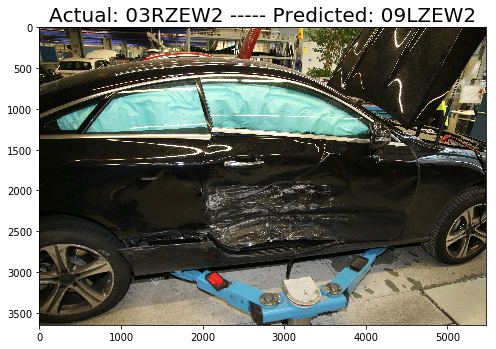

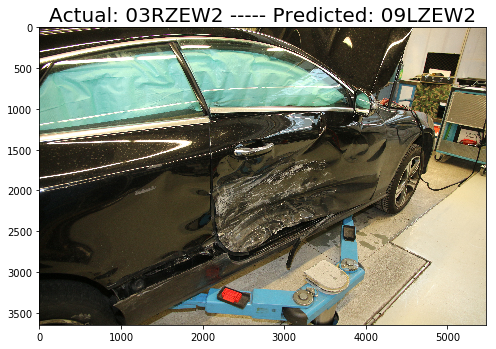

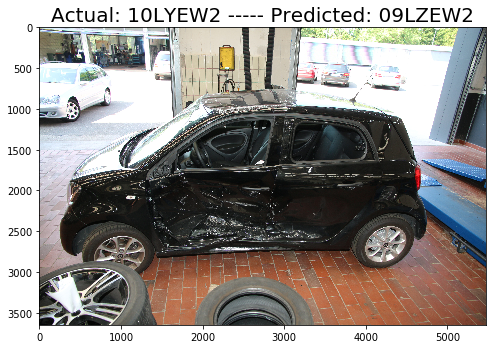

KeyError: 16

In [37]:
for i in range(len(test_df)):

    img_path = test_data_path + test_df['filename'][i]
    img = cv2.resize(plt.imread(img_path), (512, 512))/255
    
    img_pred = model.predict(img.reshape((-1,512, 512, 3)))
    pred_code = [str(label_enc_dict[i].inverse_transform([np.argmax(img_pred[i])])[0]) for i in range(len(img_pred))]
    pred_code[0] = pred_code[0].zfill(2)
    pred = ''.join(pred_code)

    img_act = test_df[list(range(tot_num_classes))].loc[i,:]
    img_act = np.split(np.array(img_act), split_idx)
    act_code = [str(label_enc_dict[i].inverse_transform([np.argmax(img_act[i])])[0]) for i in range(len(img_act))]
    act_code[0] = act_code[0].zfill(2)
    act = ''.join(act_code)

    plt.figure(figsize=(8, 8))
    plt.imshow(plt.imread(img_path))
    plt.title(('Actual: ' + act + ' ----- Predicted: ' + pred), fontsize = 20)
    plt.show()